# **Analysis of the Intrusion Detection Evaluation Dataset (CIC-IDS2017)**

[Dataset Link](https://www.unb.ca/cic/datasets/ids-2017.html)

## 1. An overview of the Dataset including the Dataset Characteristics and Exploratory Data Analysis, Data Preprocessing, and performance of different models.

- **Dataset Characteristics:** CIC-IDS2017 dataset contains network traffic data for the development and evaluation of intrusion detection systems. The dataset is designed to be representative of modern network traffic and includes more than 2.8 million network packets captured over a period of seven days in a real network environment. The dataset includes normal traffic and seven different attack scenarios: Brute Force, Heartbleed, Botnet, DoS, DDoS, Web Attack and Infiltration. The dataset is highly imbalanced. The majority of records belongs to the 'Benign' class and relatively few records belongs to the other classes. The dataset consists of 2830743 rows and 79 columns. In these columns, 78 of them are features that are numerical and the 'label' column is categorical.

- **Exploratory Data Analysis:** This dataset have many duplicate values (308381), which creates bias that is not good for the machine learning model. The number of missing values and infinite values on two columns 'Flow Bytes/s' and 'Flow Packets/s' are very few comparing to the size of the dataset which is only 0.06% (1564). However, the values were handled using appropriate methods.

- **Data Preprocessing:** We dropped the duplicates, replaced any infinite values (positive or negative) with NaN (not a number) and filled the missing values with median values. Since we have a very large dataset, the initial memory usage is quite high leading to session crashes. We later worked our way through this by down casting data types based on the min and max values available. We try to reduce the memory usages that is helpful for our model.

- **Data Analysis:** We grouped similar attacks together to analyze the dataset and identify patterns in the different types of attacks. We took a sample from the population (20%). Later we did some data analysis which consist of plotting various kinds of charts, correlation matrices etc. to see the relationships between features, types of attacks present in the dataset etc. In our analysis, we noticed there are a good number of features that are strongly, even directly correlated with other features (both positive and negative). This is an issue it introduces multi-collinearity which can highly impact the machine learning models that we will develop later.

  Also, as the dataset is quite huge and has more than 70 features, it would be extremely difficult to train models using limited resources. In order to overcome this issue, we used PCA (Principal Component Analysis) to reduece dimensions. We played with the number of components to see how much information we can preserve. We monitored the '*explained_variance_ratio_*' to make sure we retain most informations. However, it was a bit challenging to reduce dimensions while preserving the information to train the models. We performed StandardScaler before performing Incremental PCA.

- **ML Models:** 

- **Performance Evaluation:** After training multiple machine learning models, we proceeded to evaluate their respective performances. Our evaluation process involved comparing the accuracy, recall, f1-score and confusion matrix of each model. Through analysis of the results, we were able to see which model performed the best and which performed worse.

## 2.	Dataset Characteristics and Exploratory Data Analysis

### 2.1 Load, View Data and Show Analysis on Rows and Columns

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt

In [7]:
# Loading the dataset
data1 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Monday-WorkingHours.pcap_ISCX.csv')
data2 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Tuesday-WorkingHours.pcap_ISCX.csv')
data3 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Wednesday-workingHours.pcap_ISCX.csv')
data4 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
data5 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')
data6 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Friday-WorkingHours-Morning.pcap_ISCX.csv')
data7 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
data8 = pd.read_csv('C:/Users/USER/Documents/MachineLearningCSV/MachineLearningCVE/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')

In [8]:
data_list = [data1, data2, data3, data4, data5, data6, data7, data8]

print('Data dimensions: ')
for i, data in enumerate(data_list, start = 1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')

Data dimensions: 
Data1 -> 529918 rows, 79 columns
Data2 -> 445909 rows, 79 columns
Data3 -> 692703 rows, 79 columns
Data4 -> 170366 rows, 79 columns
Data5 -> 288602 rows, 79 columns
Data6 -> 191033 rows, 79 columns
Data7 -> 286467 rows, 79 columns
Data8 -> 225745 rows, 79 columns


In [9]:
data = pd.concat(data_list)
rows, cols = data.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697


In [10]:
# Deleting dataframes after concating to save memory
for d in data_list: del d

In [11]:
# Renaming the columns by removing leading/trailing whitespace
col_names = {col: col.strip() for col in data.columns}
data.rename(columns = col_names, inplace = True)

In [12]:
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2830743 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int64  
 1   Flow Duration                int64  
 2   Total Fwd Packets            int64  
 3   Total Backward Packets       int64  
 4   Total Length of Fwd Packets  int64  
 5   Total Length of Bwd Packets  int64  
 6   Fwd Packet Length Max        int64  
 7   Fwd Packet Length Min        int64  
 8   Fwd Packet Length Mean       float64
 9   Fwd Packet Length Std        float64
 10  Bwd Packet Length Max        int64  
 11  Bwd Packet Length Min        int64  
 12  Bwd Packet Length Mean       float64
 13  Bwd Packet Length Std        float64
 14  Flow Bytes/s                 float64
 15  Flow Packets/s               float64
 16  Flow IAT Mean                float64
 17  Flow IAT Std                 float64
 18  Flow IAT Max                 int64  
 19  Flow I

In [14]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
data.describe().transpose()

Overview of Columns:


,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [15]:
pd.options.display.max_columns = 80
data

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3.000000e+06,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4.000000e+06,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.967213e+05,3.278689e+04,61.0,0.0,61,61,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.639344e+04,16393.44262,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225741,61378,72,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.666667e+05,2.777778e+04,72.0,0.0,72,72,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.388889e+04,13888.88889,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225742,61375,75,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.600000e+05,2.666667e+04,75.0,0.0,75,75,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.333333e+04,13333.33333,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225743,61323,48,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,2.500000e+05,4.166667e+04,48.0,0.0,48,48,48,48.0,0.0,48,48,0,0.0,0.0,0,0,0,0,0,0,40,0,4.166667e+04,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,0,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,4719,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


### 2.2 Data Cleaning









#### Identifying duplicate values


In [18]:
dups = data[data.duplicated()]
print(f'Number of duplicates: {len(dups)}')

Number of duplicates: 308381


In [19]:
data.drop_duplicates(inplace = True)
data.shape

(2522362, 79)

#### Identifying missing values


In [21]:
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])

Flow Bytes/s    353
dtype: int64


In [22]:
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Flow Bytes/s      1211
Flow Packets/s    1564
dtype: int64


In [23]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')

Initial missing values: 353
Missing values after processing infinite values: 3128


In [24]:
missing = data.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s      1564
Flow Packets/s    1564
dtype: int64


In [25]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s              1564                        0.06
Flow Packets/s            1564                        0.06


#### Visualisation of missing data


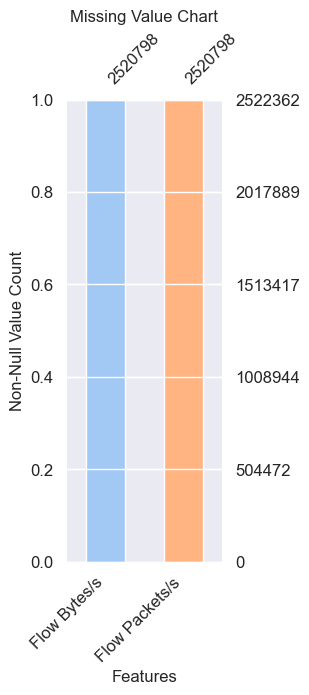

In [27]:
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in data.columns if data[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(data[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

#### Dealing with missing values (Columns with missing data)

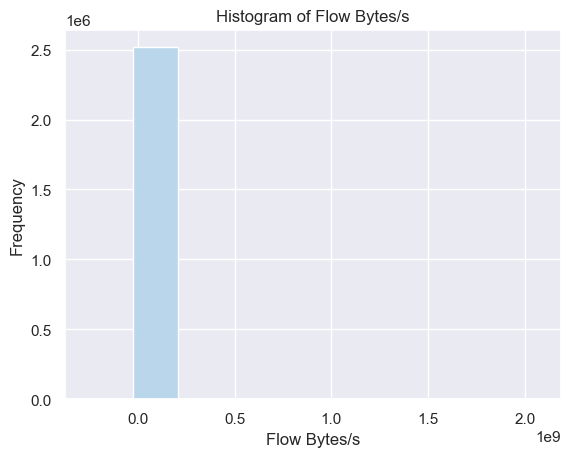

In [29]:
colors = sns.color_palette('Blues')
plt.hist(data['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()

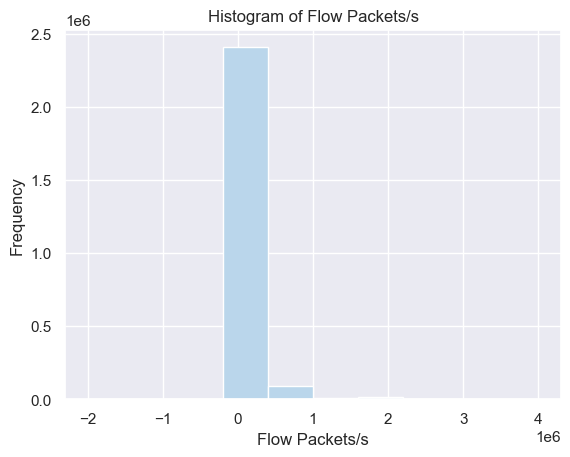

In [30]:
plt.hist(data['Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()

In [31]:
med_flow_bytes = data['Flow Bytes/s'].median()
med_flow_packets = data['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285


In [32]:
# Filling missing values with median
data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
data['Flow Packets/s'].fillna(med_flow_packets, inplace = True)

C:\Users\USER\AppData\Local\Temp\ipykernel_16544\1818654804.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\1818654804.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

In [33]:
print('Number of \'Flow Bytes/s\' missing values:', data['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', data['Flow Packets/s'].isna().sum())

Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


- The first step is to identify duplicate rows and missing or invalid values. We
identified and dropped the duplicate rows (308381 rows). From the data description, we identified that the dataset has infinity values. So, we checked and replaced the positive or negative infinity values with NaN (not a number) and counted it as a missing value. In the dataset, two features, FlowBytes/s, and Flow Packets/s contain missing values. For both columns, the number of missing values is 1564 which is 0.06% of total values.

- Flow Bytes/s and Flow Packets/s are continuous variables. We can see from the Flow Bytes/s and Flow Packets/s histogram and box plot that the majority of values are towards one area which indicates that the data is not normally distributed. The box plot of the Flow Bytes/s and Flow Packets/s shows that the variables have extreme values or outliers. So, our strategy is to fill in missing values with median value. Because, filling the missing values with the median does not introduce any new categories or disrupt the distribution of the data.

### 2.3 Analysing Patterns using Visualisations

#### Visualization of column correlation. Also, plotting Heat Map

In [37]:
data['Label'].unique()

array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack � Brute Force', 'Web Attack � XSS',
       'Web Attack � Sql Injection', 'Infiltration', 'Bot', 'PortScan',
       'DDoS'], dtype=object)

In [38]:
# Types of attacks & normal instances (BENIGN)
data['Label'].value_counts()

Label
BENIGN                        2096484
DoS Hulk                       172849
DDoS                           128016
PortScan                        90819
DoS GoldenEye                   10286
FTP-Patator                      5933
DoS slowloris                    5385
DoS Slowhttptest                 5228
SSH-Patator                      3219
Bot                              1953
Web Attack � Brute Force         1470
Web Attack � XSS                  652
Infiltration                       36
Web Attack � Sql Injection         21
Heartbleed                         11
Name: count, dtype: int64

In [39]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack � Brute Force': 'Web Attack',
    'Web Attack � XSS': 'Web Attack',
    'Web Attack � Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data['Attack Type'] = data['Label'].map(attack_map)

In [40]:
data['Attack Type'].value_counts()

Attack Type
BENIGN          2096484
DoS              193748
DDoS             128016
Port Scan         90819
Brute Force        9152
Web Attack         2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: count, dtype: int64

In [41]:
data.drop('Label', axis = 1, inplace = True)

In [42]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())

[0 2 4 5 8 6 1 7 3]


In [43]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bot
2: Brute Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port Scan
8: Web Attack


In [44]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

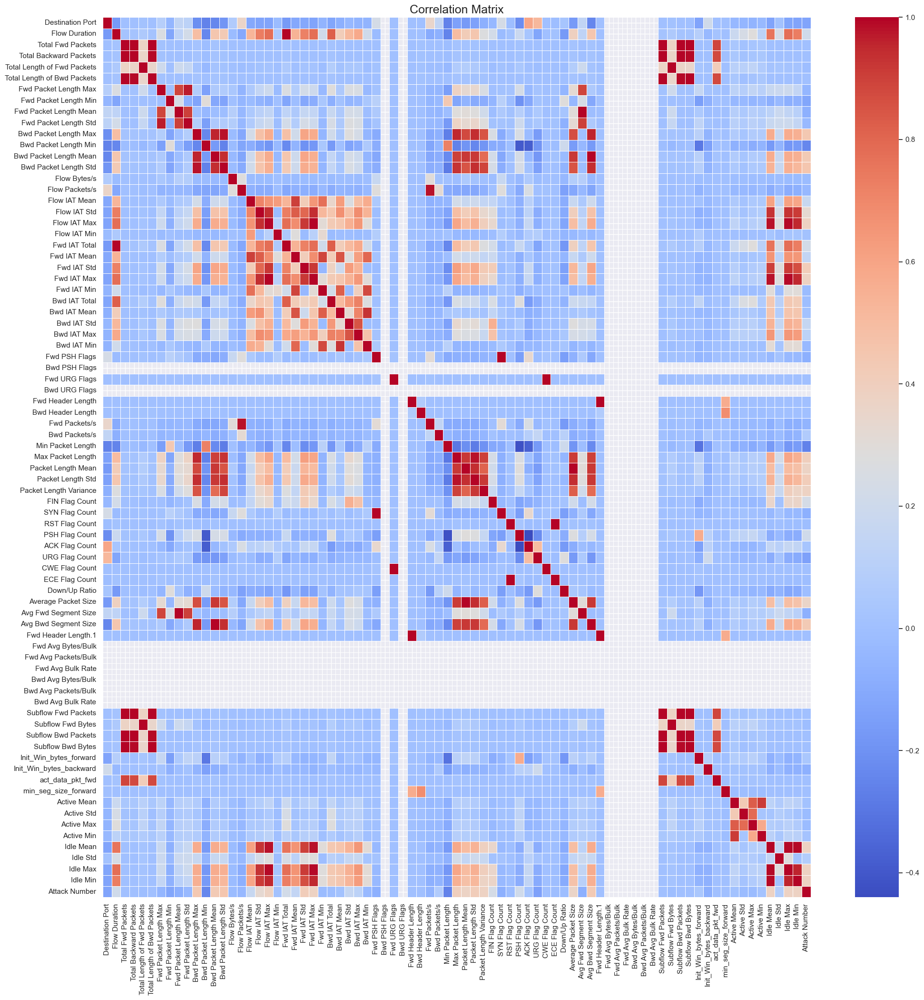

In [45]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [46]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Flow Duration            :0.21
2.  Bwd Packet Length Max    :0.44
3.  Bwd Packet Length Mean   :0.43
4.  Bwd Packet Length Std    :0.45
5.  Flow IAT Mean            :0.17
6.  Flow IAT Std             :0.33
7.  Flow IAT Max             :0.38
8.  Flow IAT Min             :0.01
9.  Fwd IAT Total            :0.22
10. Fwd IAT Mean             :0.15
11. Fwd IAT Std              :0.41
12. Fwd IAT Max              :0.38
13. Bwd IAT Mean             :0.01
14. Bwd IAT Std              :0.16
15. Bwd IAT Max              :0.12
16. Bwd Packets/s            :0.07
17. Max Packet Length        :0.4
18. Packet Length Mean       :0.37
19. Packet Length Std        :0.41
20. Packet Length Variance   :0.38
21. FIN Flag Count           :0.23
22. PSH Flag Count           :0.21
23. ACK Flag Count           :0.03
24. Average Packet Size      :0.36
25. Avg Bwd Segment Size     :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [47]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 32


In [48]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

['Bwd PSH Flags',
 'Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

- We mapped each label to the corresponding attack type. This groups similar attacks together and provides an easier and more interpretable way to analyze the dataset and identify patterns in the different types of attacks.

- For plotting the correlation matrix, we encoded the 'Attack Type' column and plotted the heatmap. From the heatmap, we observe that there are many pairs of highly correlated features. Highly correlated features in the dataset are problematic and lead to overfitting. A positive correlation exists when one variable decreases as the other variable decreases or one variable increases while the other increases. There are 32 features with positive correlations that may help in predicting the target feature.

- The columns with zero standard deviation have the same value in all rows. These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns which results in NaN correlation cofficient. These columns cannot help differentiate between the classes or groups of data. So, these zero standard deviation columns don't contribute to the correlation matrix and will appear blank in the heatmap. This can be helpful while doing data processing as we may drop the columns if we find out that these columns has no variation.

#### Visualization of Linear Relationships of columns (Continuous Numerical Variables)

In [51]:
# Data sampling for data analysis
sample_size = int(0.05 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(126118, 80)

In [52]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = data[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port                8704.762165           8667.164306           0.43%
Flow Duration                   16581323.773163       16566149.033905       0.09%
Total Fwd Packets               10.276271             9.899237              3.67%
Total Backward Packets          11.565964             11.223981             2.96%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Total Length of Fwd Packets     611.575108            603.975190            1.24%
Total Length of Bwd Packets     18133.153930          16872.391078          6.95%
Fwd Packet Length Max           231.091768            232.306150            0.53%
Fwd Packet Length Min           19.194641             19.031225             0.85%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Fwd Packet Length Mean          63.470104             63.783347             0.49%
Fwd Packet Length Std           77.277587             77.798026             0.67%
Bwd Packet Length Max           974.370031            965.377297            0.92%
Bwd Packet Length Min           43.134670             43.252938             0.27%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Bwd Packet Length Mean          340.413252            338.023251            0.70%
Bwd Packet Length Std           376.311810            372.025965            1.14%
Flow Bytes/s                    1409834.540580        1324404.438425        6.06%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Flow Packets/s                  47262.603268          47286.819306          0.05%
Flow IAT Mean                   1445245.597645        1434962.431056        0.71%
Flow IAT Std                    3276120.003337        3265670.703341        0.32%
Flow IAT Max                    10293098.691924       10257212.993189       0.35%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Flow IAT Min                    170315.698627         163672.637459         3.90%
Fwd IAT Total                   16241759.007512       16233887.495425       0.05%
Fwd IAT Mean                    2917447.144105        2900594.548724        0.58%
Fwd IAT Std                     3666365.865689        3665474.121516        0.02%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Fwd IAT Max                     10136646.258398       10106936.314888       0.29%
Fwd IAT Min                     1134966.753752        1117412.725709        1.55%
Bwd IAT Total                   11103358.523806       11104388.226629       0.01%
Bwd IAT Mean                    2026476.920068        2007002.327369        0.96%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Bwd IAT Std                     1667646.690399        1664537.324153        0.19%
Bwd IAT Max                     5257357.549892        5236498.891110        0.40%
Bwd IAT Min                     1085437.767545        1070219.378598        1.40%
Fwd PSH Flags                   0.048738              0.049501              1.57%
Bwd PSH Flags                   0.000000              0.000000              0.00%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Fwd URG Flags                   0.000032              0.000056              75.00%
Bwd URG Flags                   0.000000              0.000000              0.00%
Fwd Header Length               -29182.101016         242.223616            100.83%
Bwd Header Length               -2553.643801          266.539106            110.44%
Fwd Packets/s                   40834.353243          40965.876336          0.32%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Bwd Packets/s                   6509.474728           6416.052142           1.44%
Min Packet Length               16.823494             16.892973             0.41%
Max Packet Length               1063.097507           1055.613988           0.70%
Packet Length Mean              190.541501            189.669492            0.46%
Packet Length Std               329.998773            327.586045            0.73%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Packet Length Variance          545438.614758         538730.179224         1.23%
FIN Flag Count                  0.032147              0.032105              0.13%
SYN Flag Count                  0.048738              0.049501              1.57%
RST Flag Count                  0.000272              0.000293              7.87%
PSH Flag Count                  0.297519              0.297904              0.13%
ACK Flag Count                  0.312188              0.310709              0.47%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

URG Flag Count                  0.101428              0.099605              1.80%
CWE Flag Count                  0.000032              0.000056              75.00%
ECE Flag Count                  0.000273              0.000293              7.40%
Down/Up Ratio                   0.700350              0.697957              0.34%
Average Packet Size             212.311468            211.304157            0.47%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Avg Fwd Segment Size            63.470104             63.783347             0.49%
Avg Bwd Segment Size            340.413252            338.023251            0.70%
Fwd Header Length.1             -29182.101016         242.223616            100.83%
Fwd Avg Bytes/Bulk              0.000000              0.000000              0.00%
Fwd Avg Packets/Bulk            0.000000              0.000000              0.00%
Fwd Avg Bulk Rate               0.000000              0.000000              0.00%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Bwd Avg Bytes/Bulk              0.000000              0.000000              0.00%
Bwd Avg Packets/Bulk            0.000000              0.000000              0.00%
Bwd Avg Bulk Rate               0.000000              0.000000              0.00%
Subflow Fwd Packets             10.276271             9.899237              3.67%
Subflow Fwd Bytes               611.563349            603.975190            1.24%
Subflow Bwd Packets             11.565964             11.223981             2.96%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Subflow Bwd Bytes               18132.772274          16870.683677          6.96%
Init_Win_bytes_forward          7265.655351           7256.934886           0.12%
Init_Win_bytes_backward         2230.826079           2209.943672           0.94%
act_data_pkt_fwd                6.005904              6.104910              1.65%
min_seg_size_forward            -3080.307029          25.893671             100.84%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

Active Mean                     91521.689172          89171.657886          2.57%
Active Std                      46163.125326          45360.370115          1.74%
Active Max                      171910.435398         167449.978869         2.59%
Active Min                      65422.995532          63298.198219          3.25%
Idle Mean                       9331577.511171        9292380.516903        0.42%
Idle Std                        565443.316197         581616.294414         2.86%
Idle Max                        9757716.419817        9729574.793876        0.29%
Idle Min                        8887156.719966        8835471.345748        0.58%
Attack Number                   0.726480              0.729809              0.46%


C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
C:\Users\USER\AppData\Local\Temp\ipykernel_16544\580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
C:\U

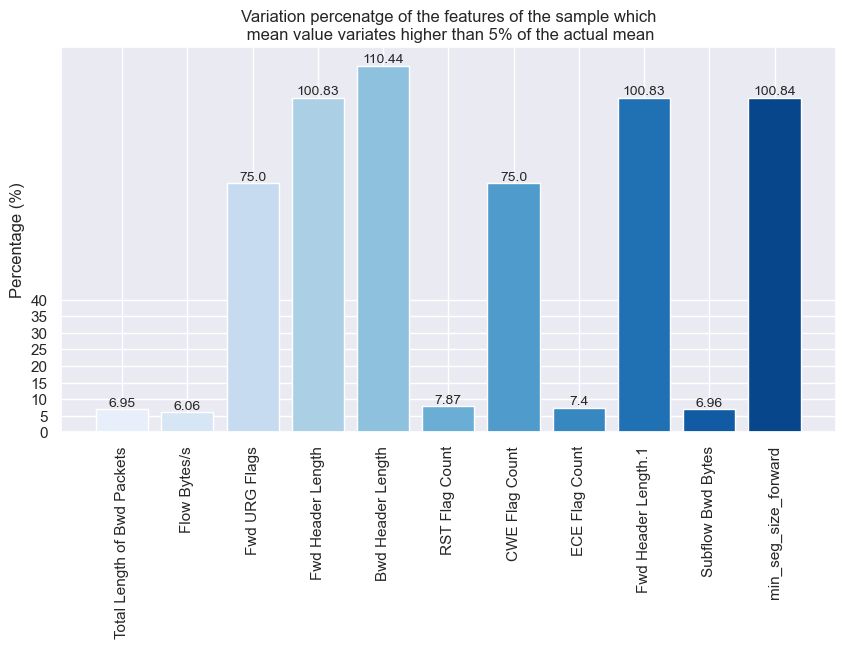

In [53]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette('Blues', n_colors=len(labels))
fig, ax = plt.subplots(figsize = (10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()

In [54]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Destination Port              : 15959
2.  Flow Duration                 : 73665
3.  Total Fwd Packets             : 353
4.  Total Backward Packets        : 432
5.  Total Length of Fwd Packets   : 4977
6.  Total Length of Bwd Packets   : 10335
7.  Fwd Packet Length Max         : 2427
8.  Fwd Packet Length Min         : 165
9.  Fwd Packet Length Mean        : 13390
10. Fwd Packet Length Std         : 20919
11. Bwd Packet Length Max         : 2689
12. Bwd Packet Length Min         : 373
13. Bwd Packet Length Mean        : 15383
14. Bwd Packet Length Std         : 18607
15. Flow Bytes/s                  : 92374
16. Flow Packets/s                : 80762
17. Flow IAT Mean                 : 77583
18. Flow IAT Std                  : 61779
19. Flow IAT Max                  : 53247
20. Flow IAT Min                  : 15942
21. Fwd IAT Total                 : 33994
22. Fwd IAT Mean                  : 44592
23. Fwd IAT Std                   : 39008
24. Fwd IAT Max     

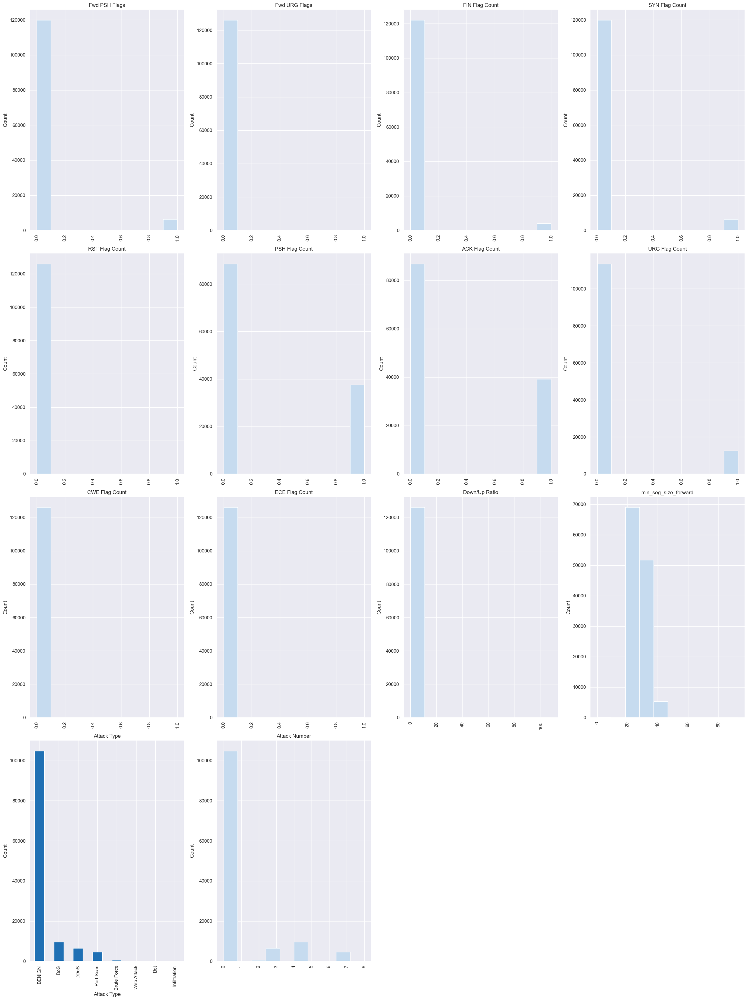

In [55]:
'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

In [56]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

C:\Users\USER\anaconda\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\USER\anaconda\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


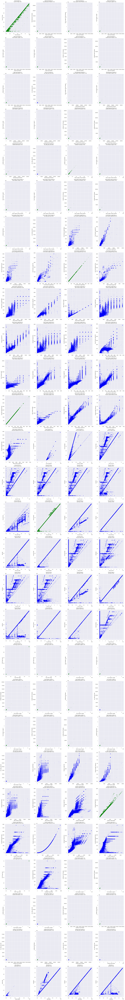

In [57]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
  for j in range(i + 1, len(cols)):
    val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
      try:
        val, x, y = high_corr_pairs[i * cols + j]
        if val > 0.99:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
      except IndexError:
        fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()

In [58]:
# Find highly correlated features
correlated_features = set()
for _, col1, col2 in high_corr_pairs:
    correlated_features.add(col2)  # Drop the second feature in each pair

# Drop them from the dataset
sampled_data = sampled_data.drop(columns=correlated_features)

print(f"Dropped {len(correlated_features)} highly correlated features.")


Dropped 37 highly correlated features.


In [59]:
sampled_data.shape

(126118, 43)

In [60]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [61]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                             Outlier Count  Outlier Percentage
Destination Port                     27322               21.66
Flow Duration                        23310               18.48
Total Fwd Packets                    12706               10.07
Total Length of Fwd Packets          15869               12.58
Fwd Packet Length Max                12372                9.81
Fwd Packet Length Min                  645                0.51
Bwd Packet Length Max                18766               14.88
Bwd Packet Length Min                 3275                2.60
Flow Bytes/s                         23799               18.87
Flow Packets/s                       12658               10.04
Flow IAT Mean                        25243               20.02
Flow IAT Std                         21831               17.31
Flow IAT Min                         24049               19.07
Bwd IAT Total                        26303               20.86
Bwd IAT Mean                         25927             

In [62]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Destination Port
- BENIGN: 23367 (22.30%)
- DoS: 0 (0.00%)
- DDoS: 1 (0.02%)
- Port Scan: 556 (11.98%)
- Brute Force: 0 (0.00%)
- Web Attack: 0 (0.00%)
- Bot: 0 (0.00%)
- Infiltration: 0 (0.00%)

Feature: Flow Duration
- BENIGN: 24265 (23.16%)
- DoS: 2114 (21.98%)
- DDoS: 1124 (17.57%)
- Port Scan: 106 (2.28%)
- Brute Force: 101 (21.86%)
- Web Attack: 13 (12.04%)
- Bot: 0 (0.00%)
- Infiltration: 0 (0.00%)

Feature: Total Fwd Packets
- BENIGN: 19467 (18.58%)
- DoS: 125 (1.30%)
- DDoS: 217 (3.39%)
- Port Scan: 74 (1.59%)
- Brute Force: 0 (0.00%)
- Web Attack: 13 (12.04%)
- Bot: 2 (1.98%)
- Infiltration: 0 (0.00%)

Feature: Total Length of Fwd Packets
- BENIGN: 20334 (19.40%)
- DoS: 2527 (26.28%)
- DDoS: 1188 (18.57%)
- Port Scan: 32 (0.69%)
- Brute Force: 0 (0.00%)
- Web Attack: 5 (4.63%)
- Bot: 3 (2.97%)
- Infiltration: 0 (0.00%)

Feature: Fwd Packet Length Max
- BENIGN: 21990 (20.98%)
- DoS: 1522 (15.83%)
- DDoS: 0 (0.00%)
- Port Scan: 32 (0.69%)
- Brute Force: 0 (0.00%)
- Web

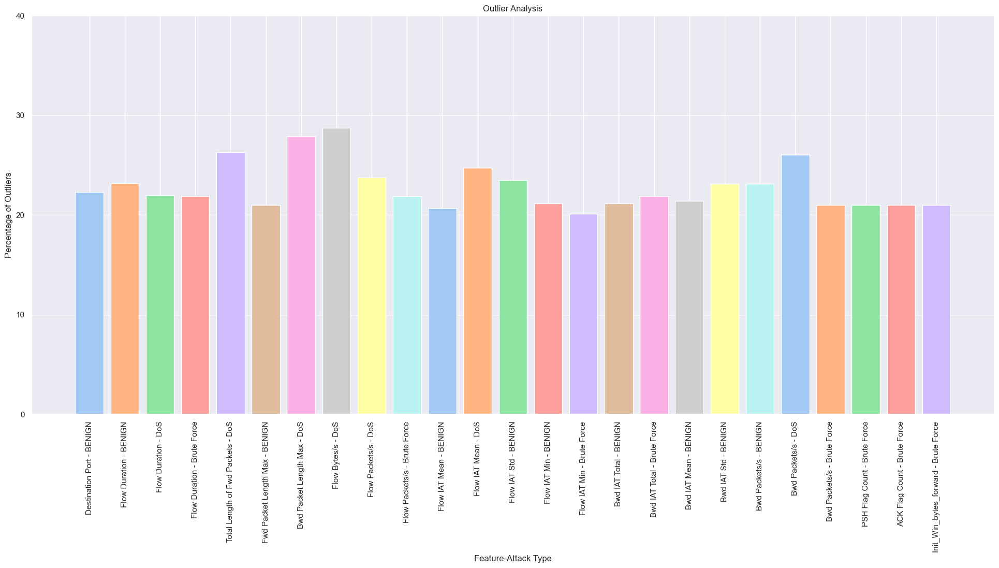

In [63]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

In [64]:
'''# Keep only non-outlier rows
filtered_data = sampled_data[~outlier.any(axis=1)]
print(f"Removed {sampled_data.shape[0] - filtered_data.shape[0]} outliers.")'''


'# Keep only non-outlier rows\nfiltered_data = sampled_data[~outlier.any(axis=1)]\nprint(f"Removed {sampled_data.shape[0] - filtered_data.shape[0]} outliers.")'

In [65]:
sampled_data.shape

(126118, 42)

- As we have a large dataset, it was both time-consuming and computationally expensive to do all the analysis on the original-sized dataset. Therefore, we sampled 20% of the dataset to do our computationally expensive analysis. We also assessed whether the sample is representative of the population by doing a comparison of descriptive statistics (mean) and features that variates 5%
higher than the actual mean values of the dataset.

- A histogram for numerical columns and a bar plot for categorical columns are generated that have more than one unique value and less than 50 unique values. The plots visualize the distribution of data in a quick and easier way. This visualizes patterns like the distribution of values in numerical columns and common categories in categorical columns. It is used to understand the relationships between different variables and identify anomalies in the data.

- The scatter plots show the relationship between strongly positive correlated features with a correlation coefficient of 0.85 or higher. Blue scatter plot points show the correlation coefficient pairs less than 0.99 and green scatter plot points show the pairs with 0.99 or almost 1.0. From these plots, we can visualize linear relationships between the features or identify indications of multicollinearity between features where two or more predictors are highly correlated. Highly correlated features introduce multicollinearity which causes problems for machine learning algorithms because it assumes that the features are independent. From some of the plots, we can see that there is a tight cluster of data points around
the straight line where the correlation coefficient is close to 1.

- We identified the outliers of each feature based on attack types and found that this dataset contains many outliers. Outliers increase variability in the dataset. But in the dataset, outliers may indicate different patterns like network intrusion attempts.

#### Visualization of column relationships (Categorical Variables)

All the features in our dataset is numerical. We have one Categorical Variable.

C:\Users\USER\AppData\Local\Temp\ipykernel_16544\323780027.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)


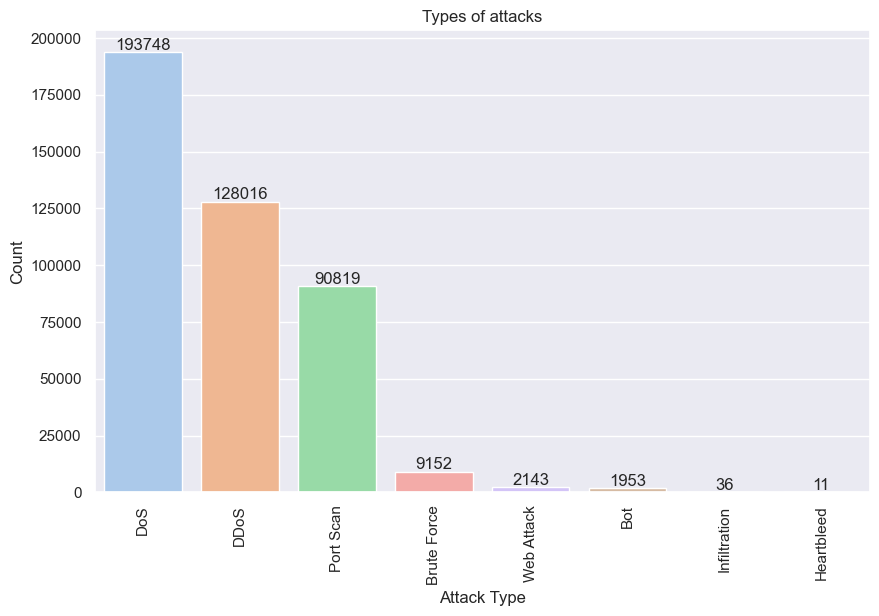

In [69]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

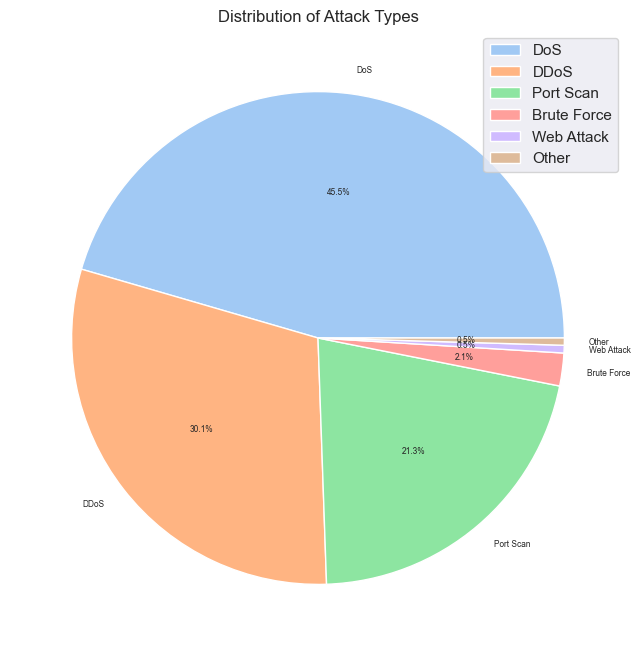

In [70]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

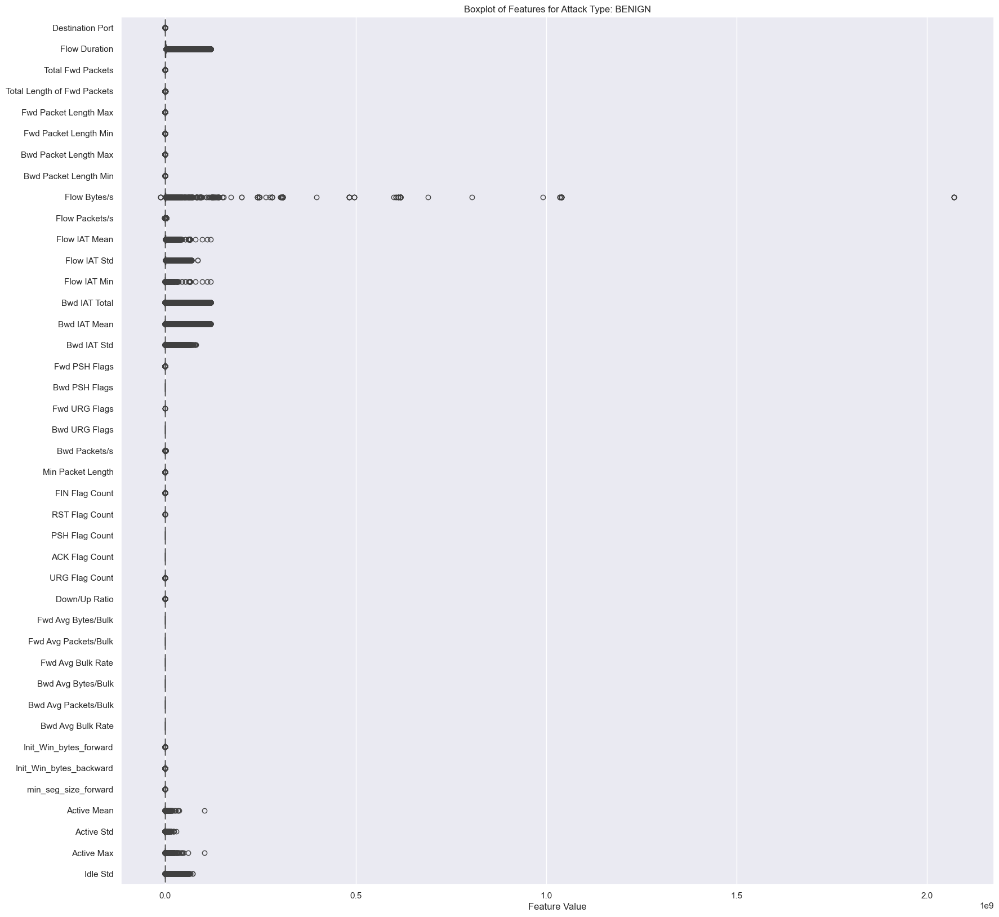

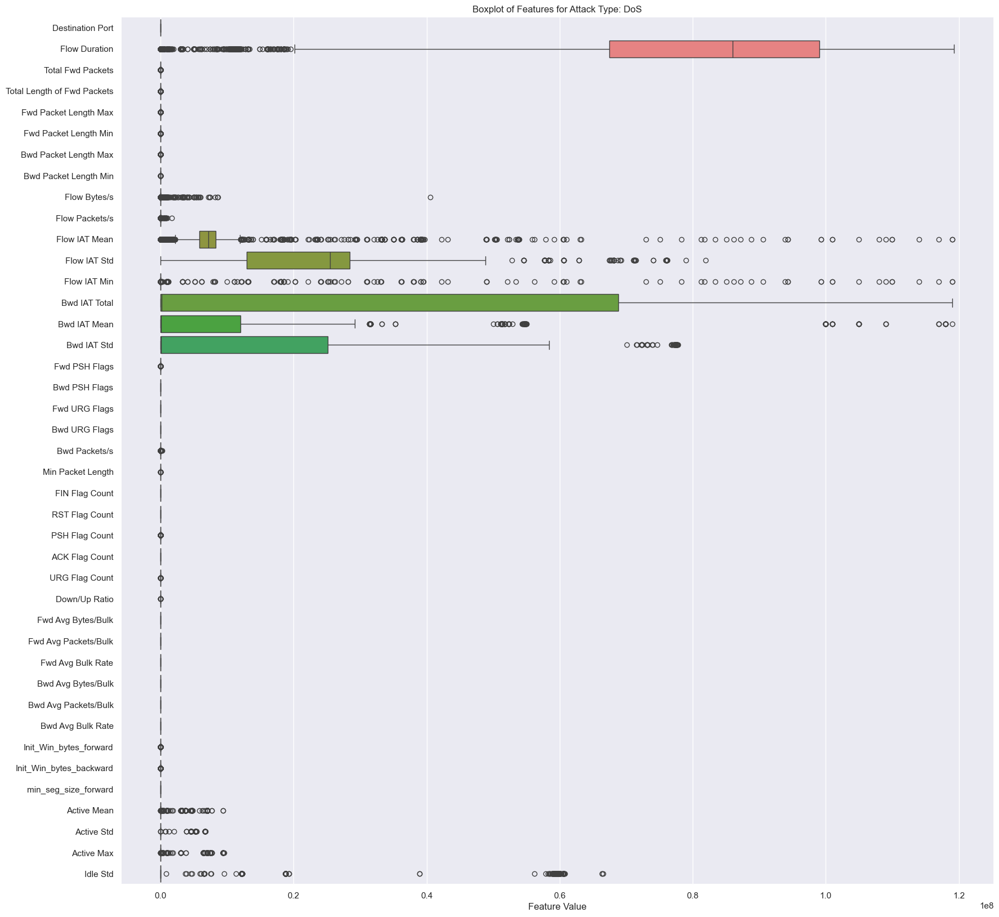

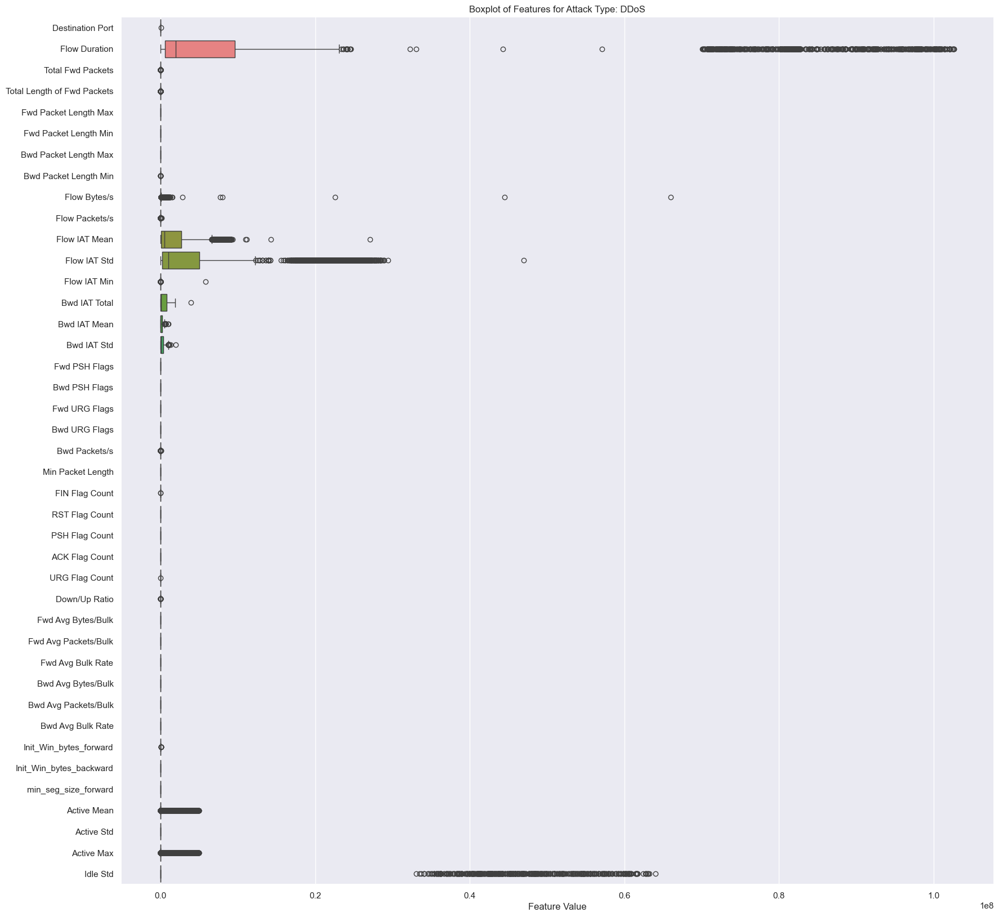

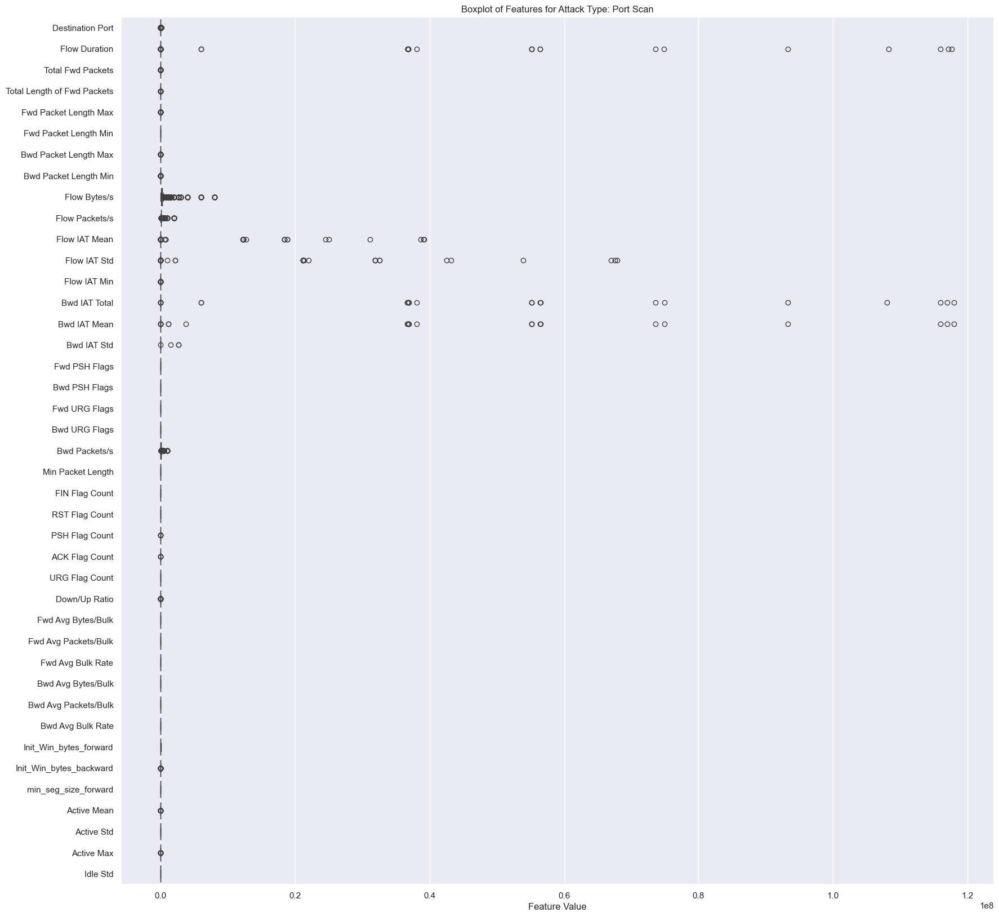

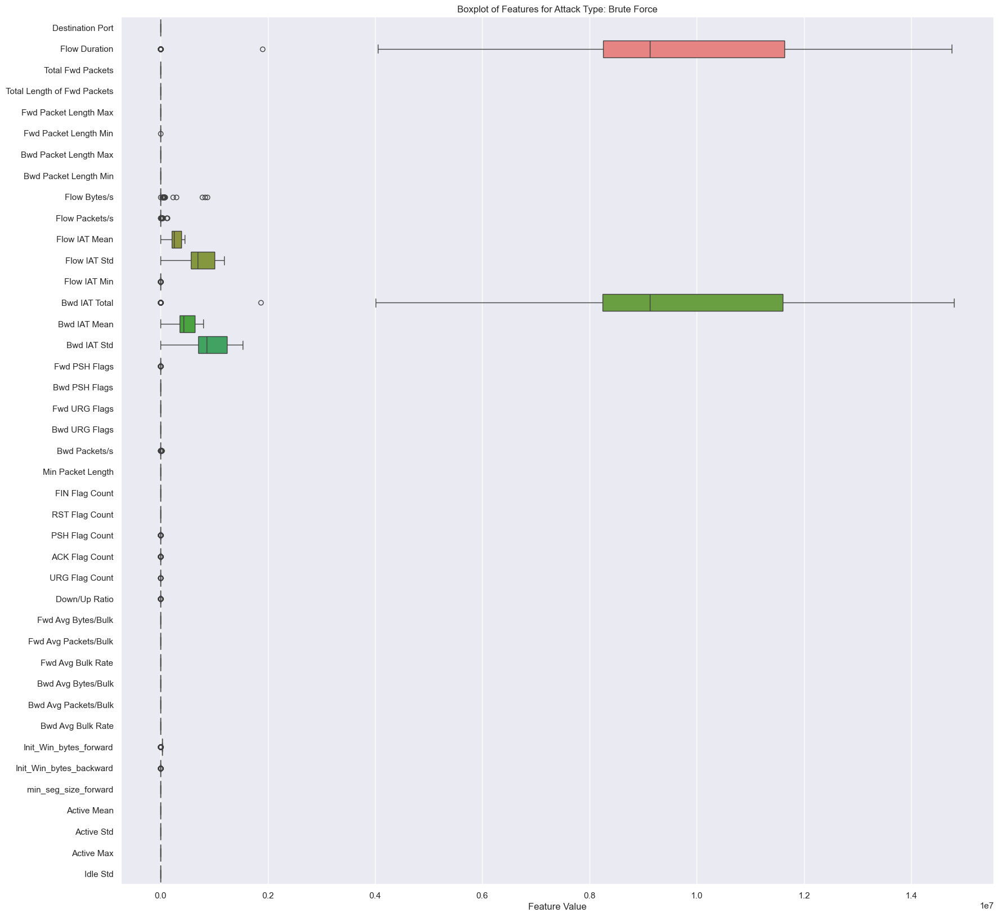

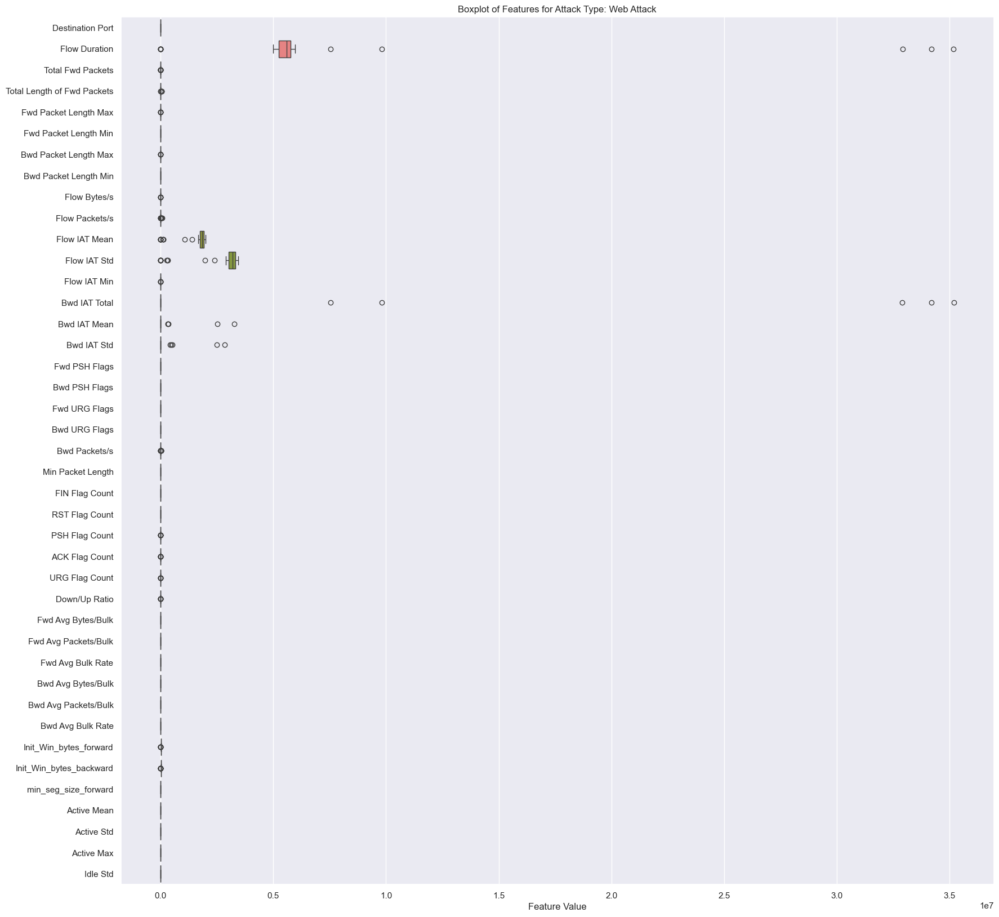

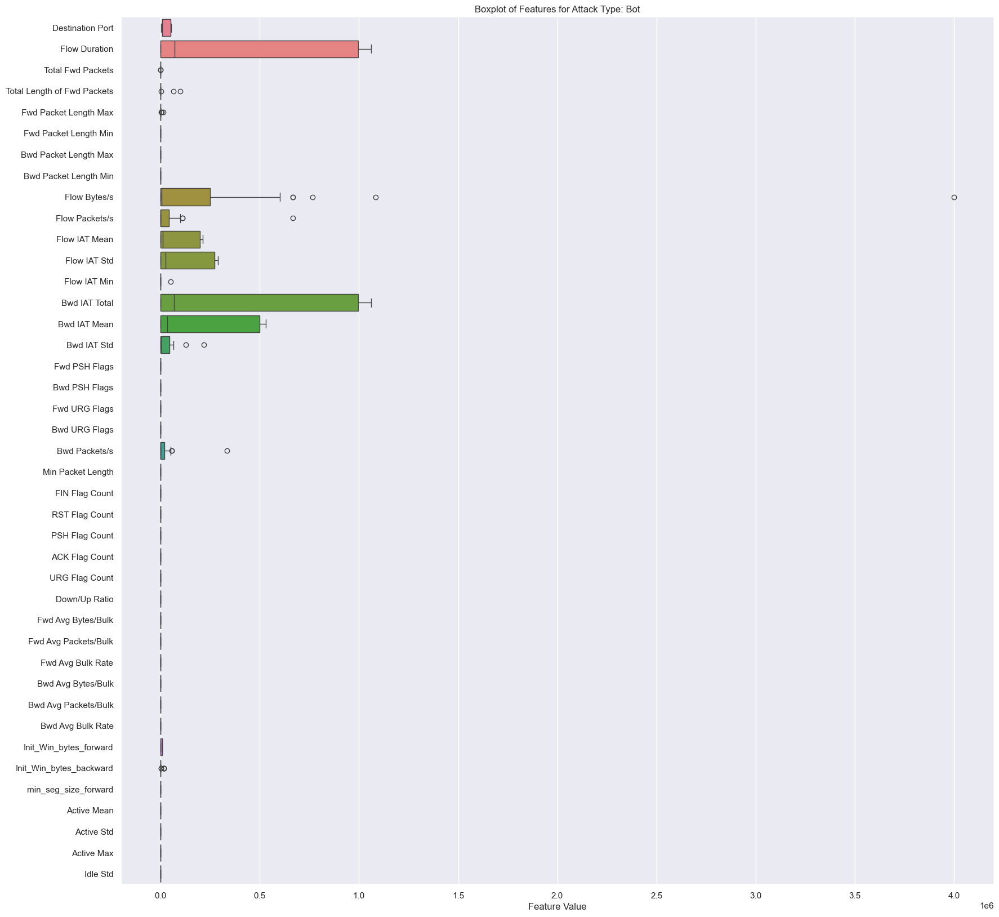

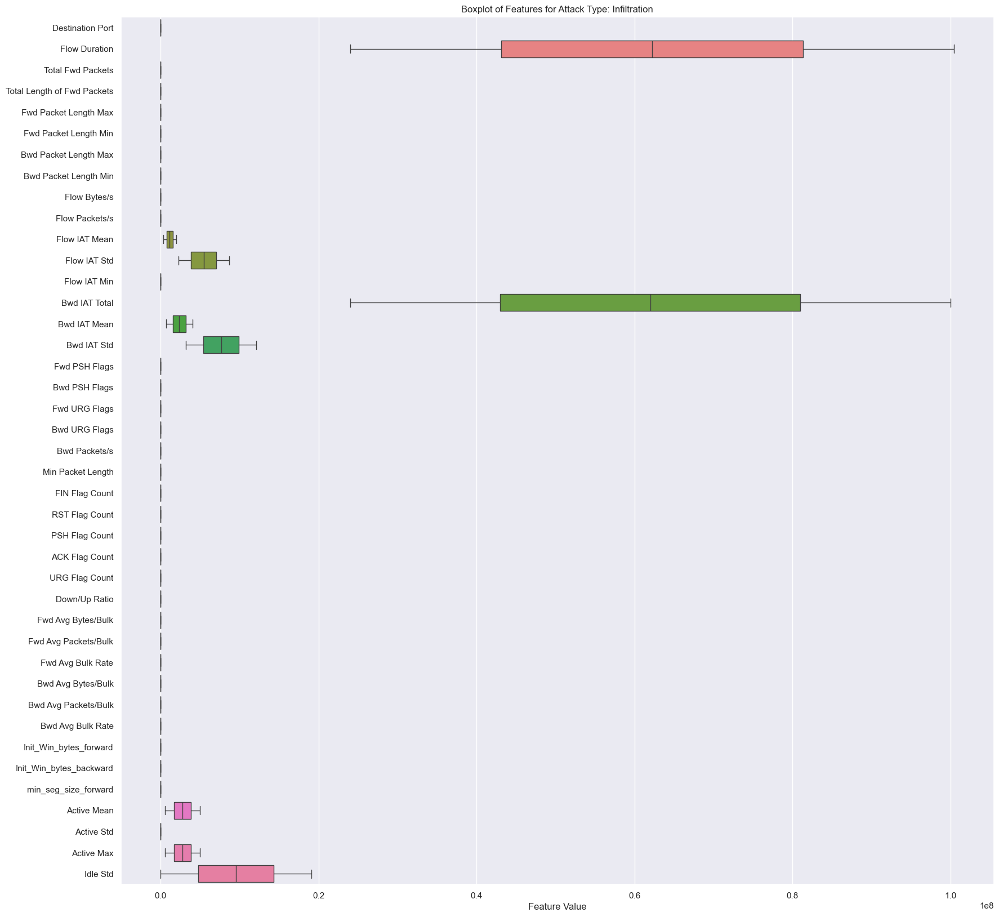

In [71]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()

In [72]:
data.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,49188,4,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,3.000000e+06,500000.000000,4.000000e+00,0.000000e+00,4,4,4,4.000000e+00,0.000000e+00,4,4,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,500000.000000,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,256,0,28.444444,85.333333,9.600908e+00,0.298990,3.541332e+06,4.901981e+06,10200000,47,51200000,6.396442e+06,5.268490e+06,10200000,234,60200000,7.518954e+06,4.645137e+06,10300000,637,0,0,0,0,296,296,0.149495,0.149495,0,322,30.421053,91.783753,8.424257e+03,0,0,0,1,0,0,0,0,1,32.111111,35.777778,28.444444,296,0,0,0,0,0,0,9,322,9,256,29200,110,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000
Brute Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,0.766852,1.738709e+06,3.010454e+06,5214882,124,5216127,2.608064e+06,3.686598e+06,5214882,1245,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,104,40,0.575139,0.191713,0,0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0.000000,104,0,0,0,0,0,0,3,0,1,0,29200,28960,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,5840,0,1658.142857,2137.297080,8.991399e+03,7.729218,1.437547e+05,4.308658e+05,1292730,2,747,3.735000e+02,5.239661e+02,744,3,1293746,2.156243e+05,5.276719e+05,1292730,2,0,0,0,0,72,152,2.318765,5.410452,0,5840,1057.545455,1853.437529,3.435231e+06,0,0,0,1,0,0,0,0,2,1163.300000,8.666667,1658.142857,72,0,0,0,0,0,0,3,26,7,11607,8192,229,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,3525,0,703.666667,1395.868284,1.029603e+03,2.707953,3.976889e+05,1.368409e+06,4951173,112,218783,3.125471e+04,3.068629e+04,78311,219,5169833,1.033967e+06,2.218975e+06,5002421,840,0,0,0,0,172,132,1.547402,1.160551,0,3525,354.866667,895.115146,8.012311e+05,0,0,0,1,0,0,0,0,0,380.214286,137.625000,703.666667,172,0,0,0,0,0,0,8,1101,6,4222,8192,254,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,17376,0,4370.686524,2566.935004,6.341193e+04,36.998316,2.703438e+04,1.746258e+05,5024984,0,119000000,4.444951e+04,2.224617e+05,5025702,0,119000000,6.904091e+04,2.738674e+05,5024984,1,0,0,0,0,85928,55336,22.505772,14.492544,0,17376,1713.525708,2669.389319,7.125639e+06,0,0,0,1,0,0,0,0,0,1713.913910,3.090875,4370.686524,85928,0,0,0,0,0,0,2685,8299,1729,7556917,29200,235,118,32,2217.0,0.00000,2217,2217,5024984.0,0.00000

## 3. Data Preprocessing

### Preprocessing

In [75]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 1539.53 MB
Final memory usage: 808.25 MB


In [76]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 47.50%


In [77]:
sampled_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Destination Port,126118.0,8.667164e+03,1.898267e+04,0.0,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,126118.0,1.656615e+07,3.525039e+07,-1.0,209.000000,50517.000000,5.315438e+06,1.200000e+08
Total Fwd Packets,126118.0,9.899237e+00,7.485525e+02,1.0,2.000000,2.000000,6.000000e+00,1.974730e+05
Total Length of Fwd Packets,126118.0,6.039752e+02,5.898237e+03,0.0,12.000000,66.000000,3.300000e+02,1.168497e+06
Fwd Packet Length Max,126118.0,2.323061e+02,7.614201e+02,0.0,6.000000,40.000000,2.020000e+02,2.482000e+04
Fwd Packet Length Min,126118.0,1.903122e+01,5.769736e+01,0.0,0.000000,2.000000,3.700000e+01,1.472000e+03
Bwd Packet Length Max,126118.0,9.653773e+02,2.025130e+03,0.0,6.000000,97.000000,7.250000e+02,1.168000e+04
Bwd Packet Length Min,126118.0,4.325294e+01,7.123523e+01,0.0,0.000000,0.000000,8.200000e+01,1.460000e+03
Flow Bytes/s,126118.0,1.324404e+06,2.402702e+07,-12000000.0,119.618120,3715.037858,1.095890e+05,2.071000e+09
Flow Packets/s,126118.0,4.728682e+04,2.015186e+05,-2000000.0,2.077641,69.742244,1.785714e+04,3.000000e+06


In [78]:
# Dropping columns with only one unique value
num_unique = sampled_data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
filtered_data = sampled_data[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index(['Bwd PSH Flags', 'Bwd URG Flags', 'Fwd Avg Bytes/Bulk',
       'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate', 'Bwd Avg Bytes/Bulk',
       'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

In [79]:
filtered_data.shape

(126118, 34)

In [80]:
# Columns after removing non variant columns
filtered_data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Length of Fwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Min', 'Bwd IAT Total',
       'Bwd IAT Mean', 'Bwd IAT Std', 'Fwd PSH Flags', 'Fwd URG Flags',
       'Bwd Packets/s', 'Min Packet Length', 'FIN Flag Count',
       'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count',
       'Down/Up Ratio', 'Init_Win_bytes_forward', 'Init_Win_bytes_backward',
       'min_seg_size_forward', 'Active Mean', 'Active Std', 'Active Max',
       'Idle Std', 'Attack Type'],
      dtype='object')

- To improve performance and reduce the risk of memory-related errors (mostly session crashes), we downcasted the float and integer values based on the presence of the minimum and maximum values and reduced memory usage by 47.5%.

- The columns with zero standard deviation have the same value in all rows.
These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns. These columns cannot help differentiate between the classes or groups of data. So, we dropped the columns that have no variation.

### Applying PCA to reduce dimensions


A simple and effective way to reduce the dimensionality of the dataset and improve the performance of the model is to use strongly correlated features. We used label encoding on the target feature where the numerical values assigned to each category do not have inherent meaning and they are arbitrary. For this reason, the correlation matrix calculated using label-encoded variables may not accurately reflect the true relationships between the variables.

So, a more flexible approach to feature selection can be PCA. PCA is a technique that transforms original set of variables into a smaller set of uncorrelated variables, called principal components.

PCA can capture more complex relationships between variables that may not be evident from correlation matrix analysis. It can also help to reduce the risk of overfitting.

Here, we applied Incremental PCA. Incremental PCA is a variant of PCA that allows for the efficient computation of principal components of a large dataset that cannot be stored in memory.

We applied StandardScaler before performing Incremental PCA to standardize the data values into a standard format.


In [84]:
# Standardizing the dataset
from sklearn.preprocessing import StandardScaler

features = filtered_data.drop('Attack Type', axis = 1)
attacks = filtered_data['Attack Type']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

In [85]:
from sklearn.decomposition import IncrementalPCA

size = len(features.columns) // 2
ipca = IncrementalPCA(n_components = size, batch_size = 500)
for batch in np.array_split(scaled_features, len(features) // 500):
    ipca.partial_fit(batch)

print(f'information retained: {sum(ipca.explained_variance_ratio_):.2%}')

information retained: 80.92%


In [86]:
transformed_features = ipca.transform(scaled_features)
new_data = pd.DataFrame(transformed_features, columns = [f'PC{i+1}' for i in range(size)])
new_data['Attack Type'] = attacks.values

In [87]:
new_data

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,Attack Type
0,-1.271204,-1.471956,-0.241429,0.418434,0.162373,-0.234112,0.152352,-0.296948,-0.086273,0.434941,0.136813,-0.344265,0.527575,0.127854,-0.240423,-0.134090,BENIGN
1,3.750184,-0.257573,0.992813,-0.453580,-0.101530,-0.223800,0.426842,0.608194,0.435780,0.065654,0.830615,-0.413291,0.452915,-0.012253,-0.792082,-0.367939,BENIGN
2,-0.031682,0.036684,1.960293,-1.545670,-0.027467,0.406582,-0.400590,0.604707,0.142762,-0.053693,-0.599993,0.304026,-0.549430,0.238128,-0.028552,-0.040168,BENIGN
3,-1.474881,-1.721373,-0.169538,0.431393,-0.020751,0.153505,-0.032897,0.136751,0.163281,-0.278407,-0.144041,0.290250,-0.412731,-0.327303,0.386469,-0.016877,BENIGN
4,-1.412871,2.949328,-1.158513,0.817198,0.471317,-0.838262,-1.733159,0.174470,0.111845,-0.439377,-0.245584,0.674783,-1.046305,-0.055093,0.025996,-1.010833,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126113,-1.518875,-2.020047,-0.428028,0.727200,0.200982,-0.170844,0.201984,-0.133749,0.030710,0.402413,0.081067,-0.400304,0.620679,0.055167,-0.149855,0.037887,BENIGN
126114,-1.386840,-1.761339,-0.294606,0.515932,0.165798,-0.237917,0.208197,-0.323212,-0.082187,0.317805,0.179040,-0.342748,0.560611,-0.052492,-0.091305,-0.261457,BENIGN
126115,0.062527,0.031859,1.967362,-1.626979,-0.015574,0.366988,-0.375328,0.480590,0.112493,-0.076871,-0.749226,0.321217,-0.563289,0.362314,-0.001950,0.057089,BENIGN
126116,-1.765658,-2.509282,-0.606703,1.013556,0.221111,-0.121279,0.326989,0.072331,0.024659,0.260517,-0.018948,-0.485474,0.763062,-0.099811,0.011052,0.086783,BENIGN


In [88]:
new_data.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,Attack Type
0,-1.271204,-1.471956,-0.241429,0.418434,0.162373,-0.234112,0.152352,-0.296948,-0.086273,0.434941,0.136813,-0.344265,0.527575,0.127854,-0.240423,-0.134090,BENIGN
1,3.750184,-0.257573,0.992813,-0.453580,-0.101530,-0.223800,0.426842,0.608194,0.435780,0.065654,0.830615,-0.413291,0.452915,-0.012253,-0.792082,-0.367939,BENIGN
2,-0.031682,0.036684,1.960293,-1.545670,-0.027467,0.406582,-0.400590,0.604707,0.142762,-0.053693,-0.599993,0.304026,-0.549430,0.238128,-0.028552,-0.040168,BENIGN
3,-1.474881,-1.721373,-0.169538,0.431393,-0.020751,0.153505,-0.032897,0.136751,0.163281,-0.278407,-0.144041,0.290250,-0.412731,-0.327303,0.386469,-0.016877,BENIGN
4,-1.412871,2.949328,-1.158513,0.817198,0.471317,-0.838262,-1.733159,0.174470,0.111845,-0.439377,-0.245584,0.674783,-1.046305,-0.055093,0.025996,-1.010833,BENIGN


In [89]:
# Convert 'Attack Type' column: 0 for BENIGN, 1 for all other attack types
new_data['Attack Type'] = new_data['Attack Type'].apply(lambda x: 0 if x == 'BENIGN' else 1)

# Verify the transformation
print(new_data['Attack Type'].value_counts())



Attack Type
0    104790
1     21328
Name: count, dtype: int64


# K-Means Clustering
K-Means is a centroid-based clustering algorithm. For anomaly detection:

Treat small clusters or points far from centroids as anomalies.

Use the inertia or silhouette score to evaluate clustering performance.



Steps:
Choose the number of clusters (k):

Use the Elbow Method or Silhouette Score to determine the optimal k.

For anomaly detection, you can set k to a higher value (e.g., 10–20) to capture small
er clusters.

Fit K-Means:

Use KMeans from 
sklearn.cluster.

Detect anomalies:

Calculate the distance of each point to its nearest centroid.

Points with the largest distances are potential anomalies.

In [130]:
# Features (PC1 to PC35)
X= new_data.iloc[:, :-1]  # Exclude the 'Attack Type' column

# Labels (for evaluation)
y = new_data['Attack Type']

### Elbow Method Analysis
Inertia decreases as the number of clusters (k) increases.

The "elbow" is the point where the rate of decrease in inertia slows down significantly. This is typically the optimal k plot:

Inertia decreases sharply up to k = 5.0.

After k = 5.0, the decrease in inertia becomes more gradual.

Optimal k: The elbow appears to be around k = 5.

Optimal number of clusters (k): 10


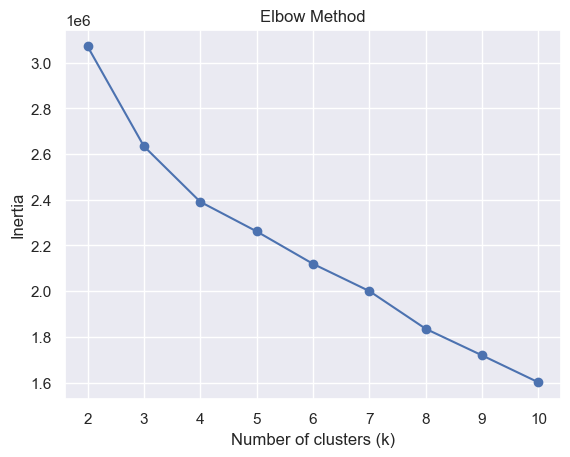

In [132]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Définir les plages de k à tester
K_range = range(2, 11)  # Essayer k de 2 à 10

silhouette_scores = []
inertia_values = []  # Liste pour stocker les inerties

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    
    # Calculer le score de silhouette
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

    # Stocker l'inertie
    inertia_values.append(kmeans.inertia_)

# Trouver le k optimal
optimal_k = K_range[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal number of clusters (k): {optimal_k}")

# Tracer la courbe du "Elbow Method"
plt.plot(list(K_range), inertia_values, 'bo-')  # Utiliser la liste K_range
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()


### Silhouette Score Analysis
Silhouette Score measures how well-separated the clusters are.

Higher scores indicate better-defined clusters plot:

The highest silhouette score occurs at k = 5.0 (score ≈ 0.575).

The score decreases gradually as k increases beyond 5.

Optimal k: The best silhouette score is at k = 5.



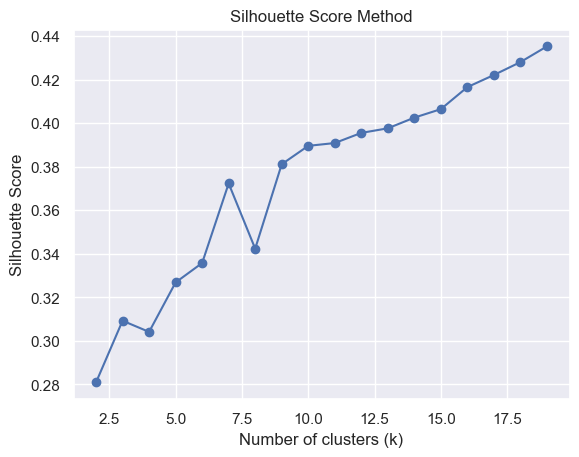

In [138]:
from sklearn.metrics import silhouette_score

# Range of k values to test
K = range(2, 20)
silhouette_scores = []

# Calculate silhouette score for each k
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    score = silhouette_score(X, kmeans.labels_)
    silhouette_scores.append(score)

# Plot Silhouette Scores
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method')
plt.show()

# Choose the k with the highest silhouette score.
# If the scores are similar for multiple k, consider the context of your problem.

### Davies-Bouldin Index Analysis
Davies-Bouldin Index measures the average similarity between clusters.

Lower values indicate better clusterin plot:

The lowest Davies-Bouldin Index occurs at k = 5.0 (index ≈ 0.9).

The index increases slightly as k increases beyond 5.

Optimal k: The best Davies-Bouldin Index is at k = 5.

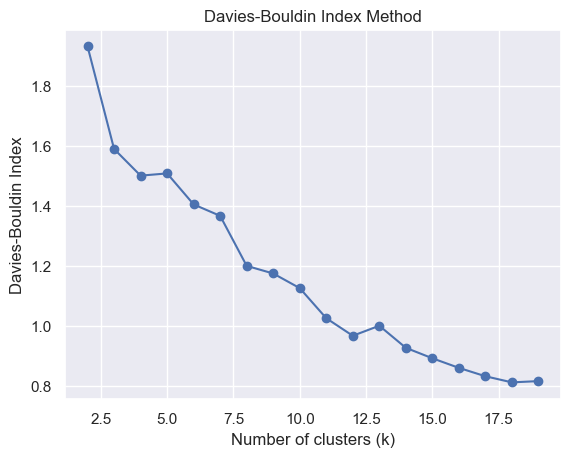

In [140]:
from sklearn.metrics import davies_bouldin_score

# Range of k values to test
K = range(2, 20)
davies_bouldin_scores = []

# Calculate Davies-Bouldin Index for each k
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    score = davies_bouldin_score(X, kmeans.labels_)
    davies_bouldin_scores.append(score)

# Plot Davies-Bouldin Scores
plt.plot(K, davies_bouldin_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index Method')
plt.show()

# Choose the k with the lowest Davies-Bouldin Index.

Conclusion: k=10

In [142]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(X)


KMeans(n_clusters=10, random_state=42)

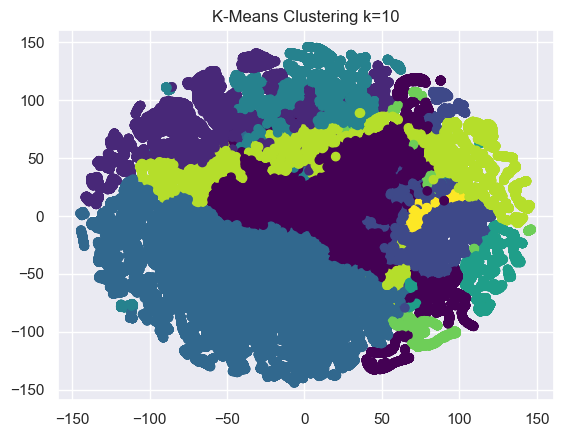

In [152]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reduce to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

# Plot clusters
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans.labels_, cmap='viridis')
plt.title('K-Means Clustering k=10')
plt.show()

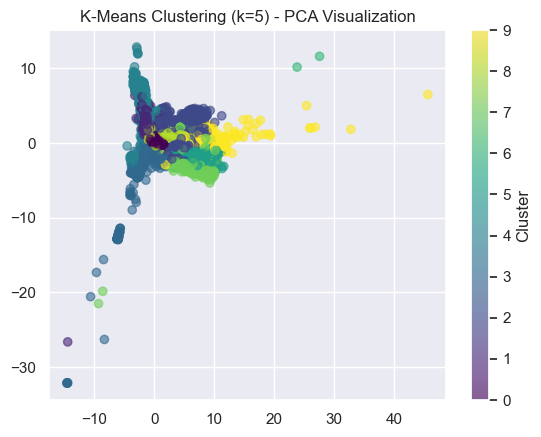

In [153]:
from sklearn.decomposition import PCA

# Reduce to 2D using PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# Plot clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_, cmap='viridis', alpha=0.6)
plt.title('K-Means Clustering (k=5) - PCA Visualization')
plt.colorbar(label='Cluster')
plt.show()

## Detect Anomalies
To detect anomalies, we’ll:

Calculate the distance of each point to its nearest centroid.

Identify points with the largest distances as anom:

Define a threshold (e.g., top 5% of distances).

Points with distances greater than the threshold are considered anomalies.lies.

In [155]:
X = X.values  # Converts DataFrame to NumPy array

Number of anomalies: 12612


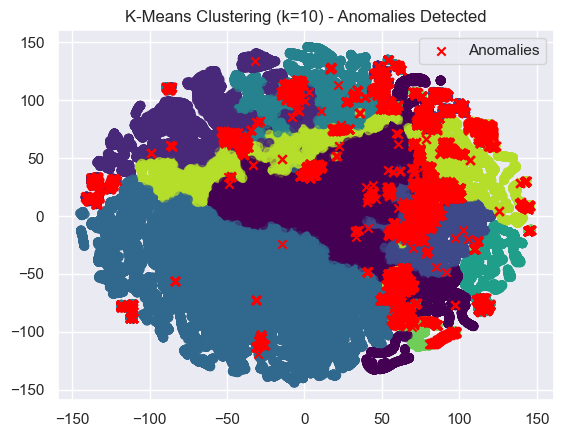

In [156]:

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Calculate distances of each point to its nearest centroid
distances = np.sqrt(((X - centroids[kmeans.labels_])**2).sum(axis=1))

# Define threshold (e.g., top 5%)
threshold = np.percentile(distances, 90)

# Identify anomalies
anomalies = distances > threshold

# Print number of anomalies
print(f"Number of anomalies: {sum(anomalies)}")

# Plot anomalies on t-SNE visualization
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans.labels_, cmap='viridis', alpha=0.6)
plt.scatter(X_tsne[anomalies, 0], X_tsne[anomalies, 1], c='red', marker='x', label='Anomalies')
plt.title('K-Means Clustering (k=10) - Anomalies Detected')
plt.legend()
plt.show()

In [157]:
# Map labels to numeric values
y_numeric = y.map({
    'BENIGN': 0,          # Normal traffic
    'Brute Force': 1,     # Attack
    'Bot': 1,             # Attack
    'Web Attack': 1,      # Attack
    'DoS': 1,             # Attack
    'DDoS': 1,            # Attack
    'Port Scan': 1        # Attack
})

In [158]:
# Convert boolean anomalies to numeric (1 for anomalies, 0 for normal)
anomalies_numeric = anomalies.astype(int)

In [159]:
from sklearn.metrics import accuracy_score

# Assuming 'y' is the ground truth labels (0 for normal, 1 for anomaly)
# 'predictions' contains the model's anomaly predictions (0 for normal, 1 for anomaly)

accuracy = accuracy_score(y, anomalies)
print(f"KMEANS Accuracy: {accuracy:.4f}")


KMEANS Accuracy: 0.7738


In [160]:
# Try different thresholds (e.g., top 1%, 5%, 10%, etc.)
thresholds = [99, 95, 90, 85]  # Percentiles to try

for threshold_percentile in thresholds:
    threshold = np.percentile(distances, threshold_percentile)
    anomalies = distances > threshold

    # Evaluate
    print(f"Threshold: {threshold_percentile}%")
    accuracy = accuracy_score(y, anomalies)
    print(f"KMEANS Accuracy: {accuracy:.4f}")

Threshold: 99%
KMEANS Accuracy: 0.8234
Threshold: 95%
KMEANS Accuracy: 0.8020
Threshold: 90%
KMEANS Accuracy: 0.7738
Threshold: 85%
KMEANS Accuracy: 0.7604


# DBSCAN
 can identify clusters of varying shapes and sizes while treating outliers as noise. Unlike K-Means, DBSCAN does not require you to specify the number of clusters, making it more flexible for anomaly detection tasks.

 ## How DBSCAN Works
Select a Starting Point: Begin with a randomly chosen data point from the dataset

.
Define Epsilon and Min_Samples: Specify a radius (Epsilon) and a minimum number of points (Min_Samples) required to form a cluste

r.
Check Neighboring Points: Examine all points within the defined radius around the selected poi

nt.
Form a Cluster: If the number of neighboring points meets the Min_Samples requirement, a cluster is for

med.
Expand the Cluster: Repeat the process for all points in the newly formed cluster until no more points can be a

dded.
Identify Outliers: Points that are not included in any cluster are classified as outliers.

In [118]:
from sklearn.cluster import DBSCAN


In [120]:
# Create DBSCAN object
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust eps and min_samples

# Fit to data
clusters = dbscan.fit_predict(X)

In [121]:
# Identify anomalies (points with cluster label -1)
anomalies = clusters == -1

# Print number of anomalies
print(f"Number of anomalies detected: {anomalies.sum()}")

Number of anomalies detected: 6526


In [122]:
X.shape

(126118, 16)

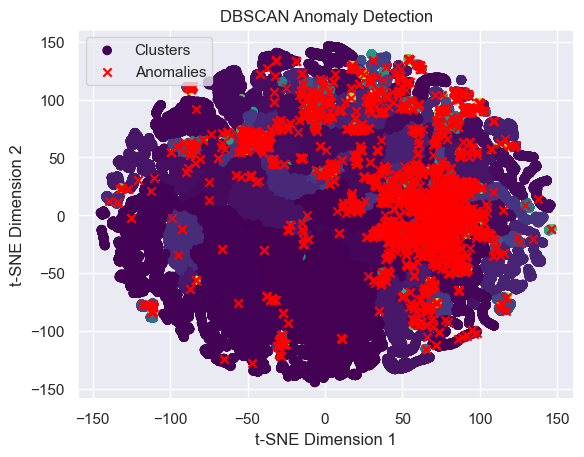

In [123]:
# Visualize the anomalies
from sklearn.manifold import TSNE

# Reduce to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)  # You can try different perplexity and random_state values
X_tsne = tsne.fit_transform(X)  

import matplotlib.pyplot as plt

# Plot clusters and anomalies
plt.scatter(X_tsne[~anomalies, 0], X_tsne[~anomalies, 1], c=clusters[~anomalies], cmap='viridis', label='Clusters')
plt.scatter(X_tsne[anomalies, 0], X_tsne[anomalies, 1], c='red', marker='x', label='Anomalies')
plt.title('DBSCAN Anomaly Detection')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.show()

In [124]:
from sklearn.metrics import accuracy_score

# Assuming 'y' is the ground truth labels (0 for normal, 1 for anomaly)
# 'predictions' contains the model's anomaly predictions (0 for normal, 1 for anomaly)

accuracy = accuracy_score(y, anomalies)
print(f"DBSCAN Accuracy: {accuracy:.4f}")


DBSCAN Accuracy: 0.7842


# Conclusion
Due to computational resource limitations, i had to work with a reduced sample of the dataset, which originally contains 2,830,743 rows and 79 columns. This constraint may have impacted data representativity and, consequently, the performance of the models.